In [ ]:
import json, os, random
from moviepy.editor import VideoFileClip

path = "data/test/"
vids = [c[:-4] for c in os.listdir(path) if c.endswith(".json")]

for (idx, clip) in enumerate(vids):
    print("{}/{}".format(idx, len(vids)))
    with open("{}{}json".format(path, clip)) as dataf:
        data = json.load(dataf)
    if 'roi' in data and not os.path.isfile(path + clip + "gif"):
        box = data['roi']
        vidclip = VideoFileClip("{}{}mp4".format(path, clip))
        vidclip.crop(x1=box['x1'], y1=box['y1'], x2=box['x1']+box['width'], y2=box['y1']+box['height']
            ).write_gif("{}{}gif".format(path, clip), program='ffmpeg', fps=15)
        vidclip.close()


Label: tras descansar de 15 a 20 minutos,


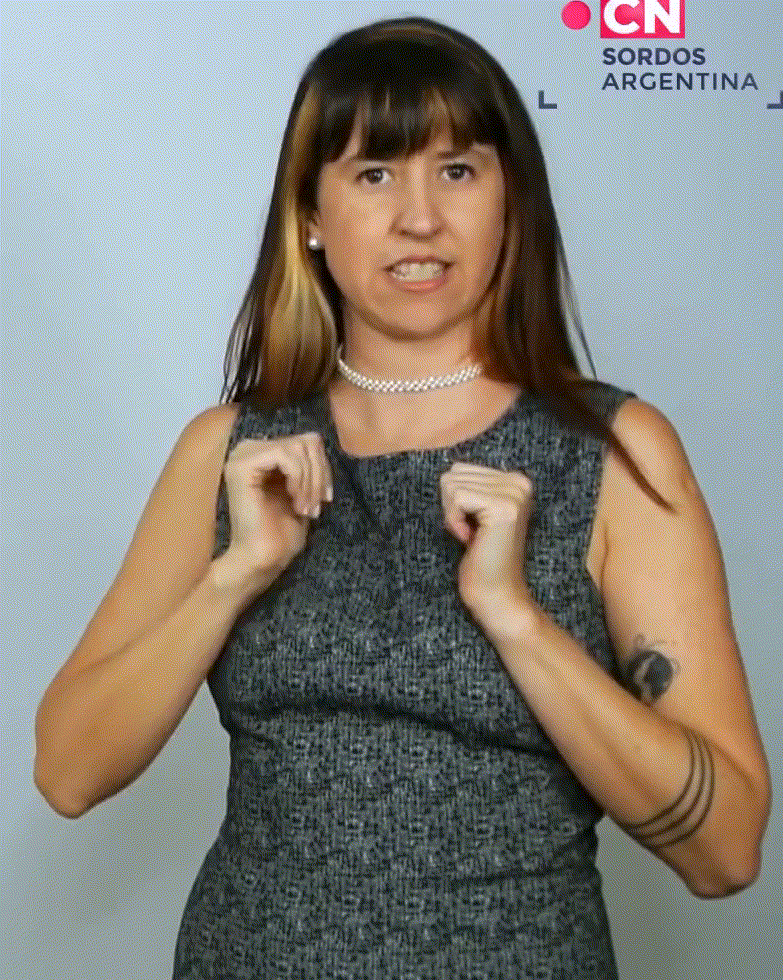

In [70]:
from IPython.display import Image, Video
from IPython.display import display


clip = random.choice(vids)
with open("{}{}json".format(path, clip)) as dataf:
    data = json.load(dataf)
if 'roi' in data:
    box = data['roi']
    label = data['label']
else:
    raise Exception("Invalid video")
print("Video: {}".format(clip))
print("Label: {}".format(label))
display(Video("{}{}mp4".format(path, clip), height=300))
display(Image("{}{}gif".format(path, clip), height=300))

In [ ]:
error = input("Crop error in video {}? y/[n]".format(clip))
if error == 'y':
    data['error'] = True
    with open("{}{}json".format(path, clip), 'w') as dataf:
        json.dump(data, dataf)